### CNN network for cubic Cu

In [1]:
import numpy as np
import time

import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.autograd import Variable

from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

from utils.models import UNet
from utils.file_reader import data_loader, data_transform, inverse_transform
from utils.plotting import iso_plot, intg_plot

In [2]:
path_to_dirs = '/home/zkn507/python_tests/density_dataset/dataset/random_bulk_cubic_Cu/'
density_in, density_out, potential, iterations = data_loader(path_to_dirs)

Potential files found in the directory.


In [3]:
# Example of isosurface of density. This is to check if the file loader worked as it should.
iso_plot(density_out[2][-1], mn = 10, mx = 40, title = 'Density')

Min : 6.9339309, and Max : 523.5964355


In [4]:
# Example of isosurface of potential. 
iso_plot(potential[2], mn = -0.2, mx = 0.1, title = 'Potential')

Min : -5.6829170, and Max : 0.3545410


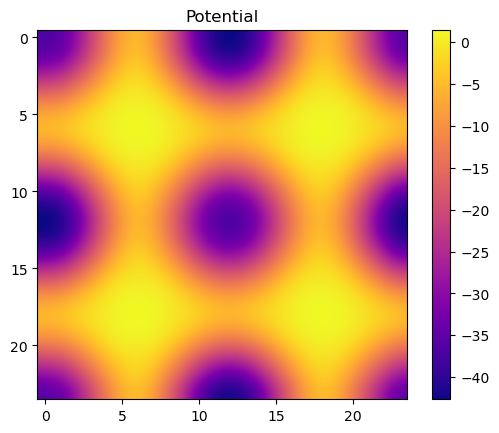

In [5]:
# Integrated plot of potential along Z axis.
intg_plot(potential[2], title = 'Potential')

In [6]:
scaler = MinMaxScaler(feature_range=(0,20)) # This does work
X, Y = data_transform(scaler, density_in, density_out, potential, iterations)

In [7]:
train_frac = 0.9
frac = int(train_frac*len(density_in))

train_X = Variable( torch.Tensor( X[:frac] ) )  
train_Y = Variable( torch.Tensor( Y[:frac] ) )  
test_X = torch.Tensor( X[frac:] ) 
test_Y = torch.Tensor( Y[frac:] ) 

In [8]:
def train_model(model, data_loader, loss_function, num_epoch, learning_rate, test_X, test_Y, 
                gamma = 1.05, step_size = 5, interval = 1):
    
    print(f"Training started at {time.asctime()}")
    print(len(f"Training started at {time.asctime()}")*"-")
    optimizer = torch.optim.Adam(model.parameters(), 
                                 lr=learning_rate)
    # For CNN case, the scheduler increases the lr value. 
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                                step_size = step_size,
                                                gamma = gamma)
    start = time.time(); output_loss = list()
    for epoch in range(num_epoch):
        model.train()
        train_loss = 0
        for step, batch in enumerate(data_loader):
            optimizer.zero_grad()
            pred = model(batch[0])
            loss = loss_function( pred, batch[1])        
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(data_loader.dataset)*np.prod( batch[0].size()[2:] )
        scheduler.step()
        if epoch%interval == 0:
            model.eval()
            acc = r2_score(model(test_X).cpu().detach().numpy().ravel(), test_Y.ravel())
            mse = mean_squared_error(model(test_X).cpu().detach().numpy().ravel(), test_Y.ravel())
            print(f"Epoch: {epoch+1}, Training loss: {train_loss:4.5f} -- Test: MSE: {mse:4.5f}, R2: {acc:4.5f}")
            output_loss += [[epoch+1, train_loss, mse, acc]]

    print(len(f"Training ended at {time.asctime()}")*"-")
    print(f"Training ended at {time.asctime()}")
    end = time.time()
    print(len(f"Training: {(end - start):6.4f} seconds.")*"=")
    print(f"Training: {(end - start):6.4f} seconds.")
    return output_loss

In [9]:
class dummy:
    pass
mdl = dummy()
mdl.input_layers = 1 #This does work
mdl.layers = 16
mdl.kernal_size = 5
mdl.residual = False
#torch.manual_seed(111)  # For debugging purpose! 
cnn_model1 = UNet(mdl)
cnn_model1.compile()
print("Number of parameters in this model {}.".format(sum(p.numel() for p in cnn_model1.parameters())) )

Number of parameters in this model 6926048.


In [10]:
loss_function = nn.MSELoss(reduction = 'sum')
batch_size = 1
num_epoch = 50
learning_rate = 0.0003

training_samples = torch.utils.data.TensorDataset(train_X, train_Y)
data_loader_trn  = torch.utils.data.DataLoader(training_samples, 
                                        batch_size=batch_size, 
                                        drop_last=False, 
                                        shuffle=True)

In [11]:
result1 = train_model(model=cnn_model1, data_loader=data_loader_trn, loss_function=loss_function, 
                      num_epoch=num_epoch, learning_rate=learning_rate, test_X=test_X, test_Y=test_Y)

Training started at Thu Jun 12 18:06:54 2025
--------------------------------------------
Epoch: 1, Training loss: 287.49341 -- Test: MSE: 110.23077, R2: -434.88293
Epoch: 2, Training loss: 97.63735 -- Test: MSE: 96.21637, R2: -306.26321
Epoch: 3, Training loss: 96.01887 -- Test: MSE: 95.79435, R2: -153.48332
Epoch: 4, Training loss: 95.52918 -- Test: MSE: 95.34494, R2: -77.61620
Epoch: 5, Training loss: 95.27848 -- Test: MSE: 95.19769, R2: -68.77322
Epoch: 6, Training loss: 95.26117 -- Test: MSE: 95.42215, R2: -71.35210
Epoch: 7, Training loss: 95.27263 -- Test: MSE: 94.97224, R2: -65.68495
Epoch: 8, Training loss: 95.12527 -- Test: MSE: 95.06136, R2: -79.46873
Epoch: 9, Training loss: 92.04249 -- Test: MSE: 77.71410, R2: -5.96748
Epoch: 10, Training loss: 77.30781 -- Test: MSE: 51.39936, R2: -0.55311
Epoch: 11, Training loss: 71.98493 -- Test: MSE: 51.58098, R2: -1.06578
Epoch: 12, Training loss: 62.78850 -- Test: MSE: 50.65125, R2: -1.59141
Epoch: 13, Training loss: 53.63886 -- Test

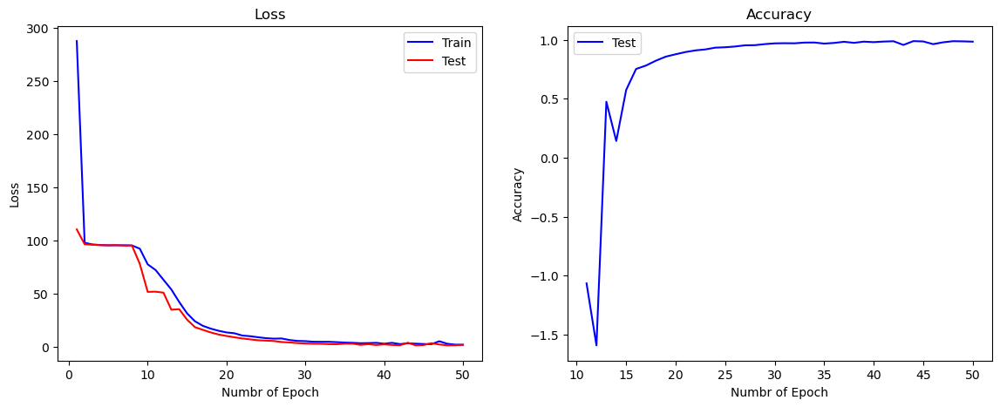

In [12]:
result1 = np.array(result1)
plt.subplot(121)
plt.plot(result1[:,0],result1[:,1],'b-')
plt.plot(result1[:,0],result1[:,2],'r-')
plt.ylabel('Loss')
plt.xlabel('Numbr of Epoch')
plt.legend(['Train','Test'])
plt.title('Loss')

plt.subplot(122)
plt.plot(result1[10:,0],result1[10:,3],'b-')
plt.ylabel('Accuracy')
plt.xlabel('Numbr of Epoch')
plt.legend(['Test'])
plt.title('Accuracy')
plt.subplots_adjust(bottom=0.0, right=1.8, top=0.8)
plt.show()

In [13]:
class dummy:
    pass
mdl = dummy()
mdl.input_layers = 2 #This does work
mdl.layers = 16
mdl.kernal_size = 5
mdl.residual = False
#torch.manual_seed(111)  # For debugging purpose! 
cnn_model2 = UNet(mdl)
cnn_model2.compile()
print("Number of parameters in this model {}.".format(sum(p.numel() for p in cnn_model1.parameters())) )

Number of parameters in this model 6926048.


In [14]:
result2 = train_model(model=cnn_model2, data_loader=data_loader_trn, loss_function=loss_function, 
                      num_epoch=num_epoch, learning_rate=learning_rate*0.5, test_X=test_X, test_Y=test_Y)

Training started at Thu Jun 12 18:19:52 2025
--------------------------------------------
Epoch: 1, Training loss: 116.19083 -- Test: MSE: 93.72543, R2: -61.73162
Epoch: 2, Training loss: 92.06773 -- Test: MSE: 84.58298, R2: -31.58595
Epoch: 3, Training loss: 80.40864 -- Test: MSE: 63.91776, R2: -4.42231
Epoch: 4, Training loss: 76.41974 -- Test: MSE: 57.07182, R2: -2.13836
Epoch: 5, Training loss: 70.68040 -- Test: MSE: 52.56706, R2: -1.53176
Epoch: 6, Training loss: 68.06044 -- Test: MSE: 46.89145, R2: -0.58718
Epoch: 7, Training loss: 61.70904 -- Test: MSE: 41.01255, R2: 0.33448
Epoch: 8, Training loss: 55.01558 -- Test: MSE: 33.69386, R2: 0.36855
Epoch: 9, Training loss: 40.98320 -- Test: MSE: 25.47135, R2: 0.63071
Epoch: 10, Training loss: 28.90165 -- Test: MSE: 19.70251, R2: 0.70318
Epoch: 11, Training loss: 18.63450 -- Test: MSE: 10.56621, R2: 0.86373
Epoch: 12, Training loss: 7.73699 -- Test: MSE: 5.82189, R2: 0.94781
Epoch: 13, Training loss: 2.25623 -- Test: MSE: 0.88929, R2:

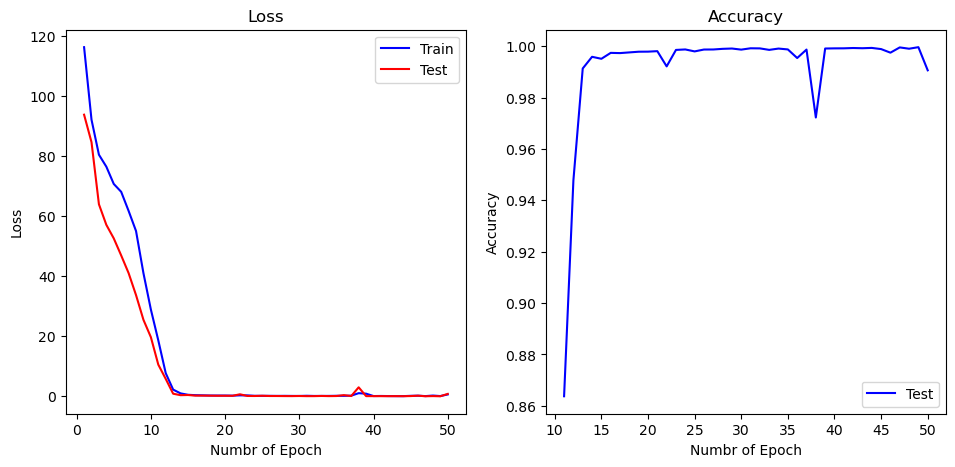

In [15]:
result2 = np.array(result2)
plt.subplot(121)
plt.plot(result2[:,0],result2[:,1],'b-')
plt.plot(result2[:,0],result2[:,2],'r-')
plt.ylabel('Loss')
plt.xlabel('Numbr of Epoch')
plt.legend(['Train','Test'])
plt.title('Loss')

plt.subplot(122)
plt.plot(result2[10:,0],result2[10:,3],'b-')
plt.ylabel('Accuracy')
plt.xlabel('Numbr of Epoch')
plt.legend(['Test'])
plt.title('Accuracy')
plt.subplots_adjust(bottom=0.0, right=1.5, top=0.8)
plt.show()

#### Let us compare if potential helps to get results faster!

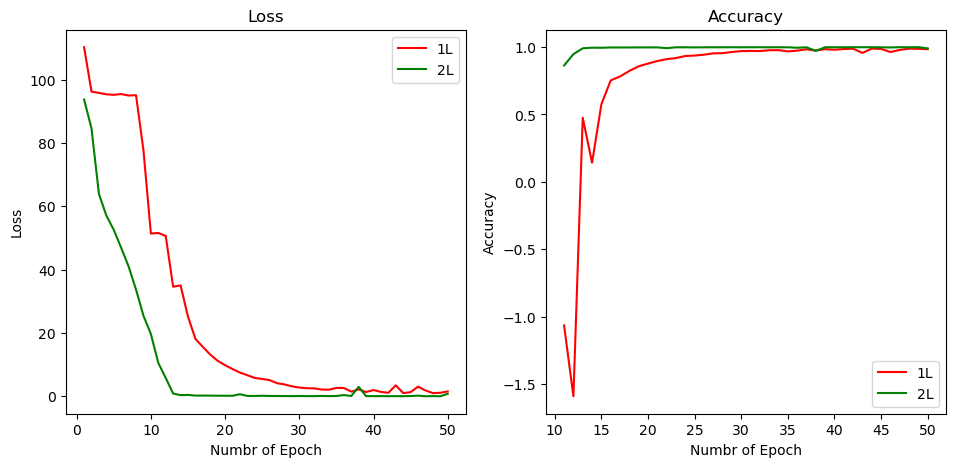

In [16]:
plt.subplot(121)
plt.plot(result1[:,0],result1[:,2],'r-')
plt.plot(result2[:,0],result2[:,2],'g-')
plt.ylabel('Loss')
plt.xlabel('Numbr of Epoch')
plt.legend(['1L','2L'])
plt.title('Loss')

plt.subplot(122)
plt.plot(result1[10:,0],result1[10:,3],'r-')
plt.plot(result2[10:,0],result2[10:,3],'g-')
plt.ylabel('Accuracy')
plt.xlabel('Numbr of Epoch')
plt.legend(['1L','2L'])
plt.title('Accuracy')
plt.subplots_adjust(bottom=0.0, right=1.5, top=0.8)
plt.show()

Min 521.92649 and Max 2888.94051 of integrated DFT charge density. 
Min -0.77006 and Max 0.14242 of integrated error. 


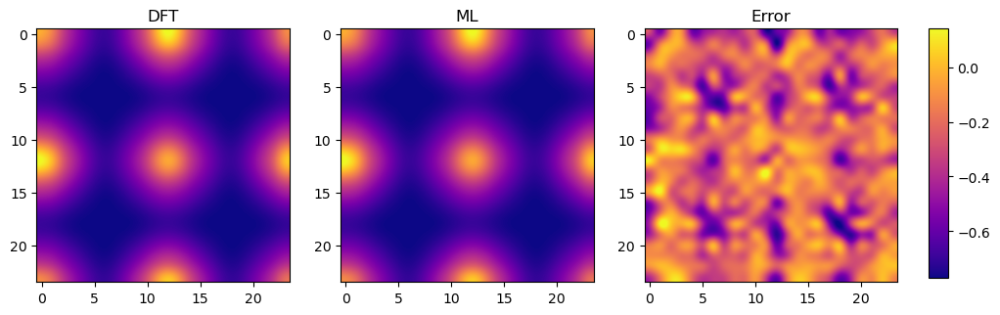

In [17]:
num_test = 1; axis = 2
plot_dft  = inverse_transform(scaler, test_Y[num_test].detach().numpy())
plot_ml   = inverse_transform(scaler, cnn_model1(test_X)[num_test].detach().numpy())
plot_diff = plot_dft - plot_ml
min_list = [np.trapezoid(i, axis = axis).min() for i in [plot_dft, plot_ml, plot_diff]]
max_list = [np.trapezoid(i, axis = axis).max() for i in [plot_dft, plot_ml, plot_diff]]

print(f"Min {min_list[0]:5.5f} and Max {max_list[0]:5.5f} of integrated DFT charge density. \nMin {min_list[2]:5.5f} and Max {max_list[2]:5.5f} of integrated error. ")

plt.subplot(131)
plt.imshow(np.trapezoid(plot_dft, axis=axis ), cmap='plasma',
           interpolation ='spline36', 
           vmin=min_list[0], 
           vmax=max_list[0])
plt.title('DFT')

plt.subplot(132)
plt.imshow(np.trapezoid (plot_ml, axis=axis ), cmap='plasma',
           interpolation ='spline36', 
           vmin=min_list[1], 
           vmax=max_list[1])
plt.title('ML')

plt.subplot(133)
plt.imshow(np.trapezoid (plot_diff, axis=axis ), cmap='plasma',
           interpolation ='spline36', 
           vmin=min_list[2], 
           vmax=max_list[2])
plt.title('Error')

plt.subplots_adjust(bottom=0.0, right=1.5, top=0.9)
cax = plt.axes([1.55, 0.19, 0.03, 0.53])
plt.colorbar(cax=cax)
plt.show()

In [18]:
torch.save(cnn_model1.state_dict(),"models/cnn_model_1L.pt")
torch.save(cnn_model2.state_dict(),"models/cnn_model_2L.pt")